# The Nexus of a Diamond’s Clarity, Carat & Price

### Introduction

Diamonds are a girl's best friend. But how did the modern Diamond industry come to be? Diamonds were originally from India, where only select royalty had possession. In the early 20th century, major diamond mines were discovered in South Africa. This paired with Marcel Tolkowsky’s 1919 inventive diamond cutting technique that enchanted the brilliance and sparkle of diamonds, increased both supply and customer interest. Later in 1947, a British Company called De Beers launched a campaign that revolutionized the diamond industry. It was called “A Diamond is Forever'', to target people in love to show commitment to one another. At first, royalty and public figures devoured this new trend, making diamonds more than a symbol of eternal commitment, but also a symbol of status, luxury, and wealth. Thus, the classic ‘Diamond Wedding Ring’ phenomenon arose and swiftly spread across the world. With that a new social norm was born, and the demand for the diamonds skyrocketed. 
This demand has cost thousands of people their lives as companies like De Beer continued to exploit the labour of locals to meet rising demands. This included hazardous working conditions, inadequate safety measures, and, in some cases, involvement in violent conflicts where “blood diamonds” were used to fund wars, leading to widespread suffering and death in Africa. This inhumane industry continues to operate to this day. However, the majority of diamonds are now being synthesized/man-made or more ethically sourced (there's a diamond mine in Canada now), offering a more ethical and sustainable alternative that doesn't contribute to the exploitation and violence associated with traditional diamond mining in Africa. 

<br>The price of diamonds has ranged from royalty-only to stable for the modern middle class and up to a monogamous relationship. Besides supply and demand, there are two factors or properties of a diamond that greatly influence this price: carat and clarity. A diamond’s carat refers to its weight (one carat is equivalent to 0.2 grams). On the other hand, a diamond’s clarity refers to how clear it is. Diamonds often have cracks, scratches and imperfections, furthermore, diamonds with fewer imperfections have a higher clarity. Clarity is measured in 8 ordered levels from I1 (worst) to IF (best).

<br> The dataset used in this project is titled “Diamonds: Predict diamond price based on features such as carat/cut/colour/clarity/size”. This dataset contains information on the range of different carat and clarity classification identifiers used in the diamond/jewelry industry; this will help us determine how carat and clarity impact the price of a diamond. 
- Carat is a measure of diamond weight. One carat is equivalent to 0.2 grams.
- Clarity refers to how clear a diamond is. Diamonds often contain imperfections like cracks or mineral deposits. The fewer and less noticeable a diamond’s imperfections, the better its clarity. clarity contains 8 ordered levels, from “I1” (the worst) to “IF” (the best).
- Color refers to the color of the diamond. Colorless diamonds are considered better than diamonds with a yellow tint. diamonds contains diamonds of 7 different colors, represented by different letters. “D” - “F” diamonds are considered colorless, while “G” - “J” diamonds have a very faint color.
- Cut refers to how a rough diamond is shaped into a finished diamond. Better cuts create more symmetrical and luminous diamonds. cut has 5 ordered levels: “Fair,” “Good,” “Very Good,” “Premium,” “Ideal.”
- x, y, z, depth, and table are various measures of a diamond’s size, in millimeters.

<br> The research question we are asking is “How does the carat & clarity of a diamond predict the price?” We chose to use carat as a predictor because since weight = mass = how much diamond someone is getting. Thus we can predict that carat should have a positive  relationship with the price. The other predictor we are going to use is the clarity of the diamond. Since clarity deals with the purity of the diamond, we can also infer that the purer a diamond is, the higher value the consumers will place on the diamond, thus giving clarity a positive relationship with price as well. 

### Preliminary exploratory data analysis

To begin, we read our file in and then made two graphs to visualize our raw data to see if there are any clear trends. 

In [1]:
library(tidyverse)
library(tidymodels)
install.packages("kknn")
library(repr)
library(readxl)

set.seed(5)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.2     ✔ rsample      1.1.1
✔ dials        1.1.0     ✔ tune         1.0.1
✔ infer        1.0.4     ✔ workflows    1.1.2
✔ modeldata    1.0.1     ✔ workflowsets 1.0.0
✔ parsnip      1.0.3     ✔ yardstick    1.1.0
✔ recipes      1.0.4     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filter()   masks stats::filter()
✖ recipes::fixed()  masks stringr::fixed()
✖ dplyr::lag()      masks stats::lag()
✖ yardstick::spec() masks read

In [46]:
diamond <- read_csv("https://raw.githubusercontent.com/jeevaniputri/diamonds/main/diamonds.csv")


Rows: 53940 Columns: 10
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): cut, color, clarity
dbl (7): carat, depth, table, price, x, y, z

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


We recoded the clarity values from the inital table into numerical values based on the ranking of their value. 
This is so that we can manipulate and visualize it more easily later on. We also chose to take only around 10000 
points form the initial 50000 due to limitations in our device's processing capacity.

In [47]:
diamonds <- diamond |>
            slice(seq(from=1, to=nrow(diamonds), by=5)) |>
            mutate(clarity = recode(clarity, "I1"=1, "SI2"=2, "SI1"=3, "VS2"=4, "VS1"=5, "VVS2"=6, "VVS1"=7, "IF"=8))
head(diamonds)


carat,cut,color,clarity,depth,table,price,x,y,z
<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.23,Ideal,E,2,61.5,55,326,3.95,3.98,2.43
0.24,Very Good,J,6,62.8,57,336,3.94,3.96,2.48
0.30,Good,J,3,64.0,55,339,4.25,4.28,2.73
0.32,Premium,E,1,60.9,58,345,4.38,4.42,2.68
0.30,Good,I,2,63.3,56,351,4.26,4.30,2.71
0.23,Very Good,G,6,60.4,58,354,3.97,4.01,2.41


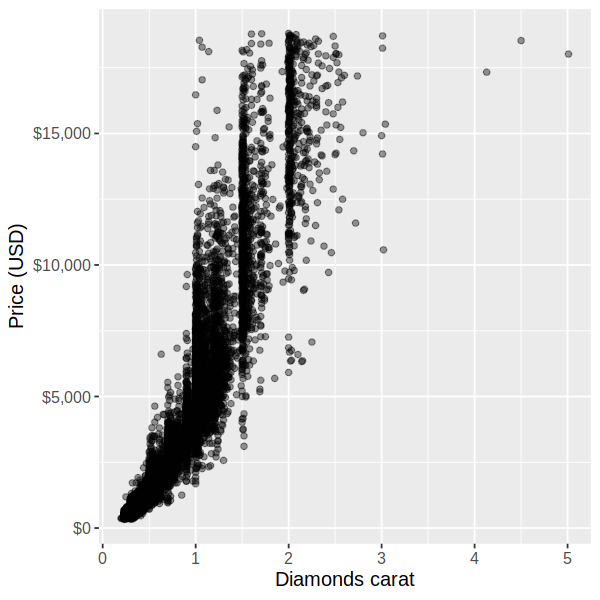

In [20]:
options(repr.plot.width = 5, repr.plot.height = 5)
plot_carat <- ggplot(diamonds, aes(x = carat, y = price)) +
              geom_point(alpha = 0.4) +
              xlab("Diamonds carat") +
              ylab("Price (USD)") +
              scale_y_continuous(labels = dollar_format()) + 
              theme(text = element_text(size = 12))
plot_carat

Visualize the clarity vs price as a scatterplot

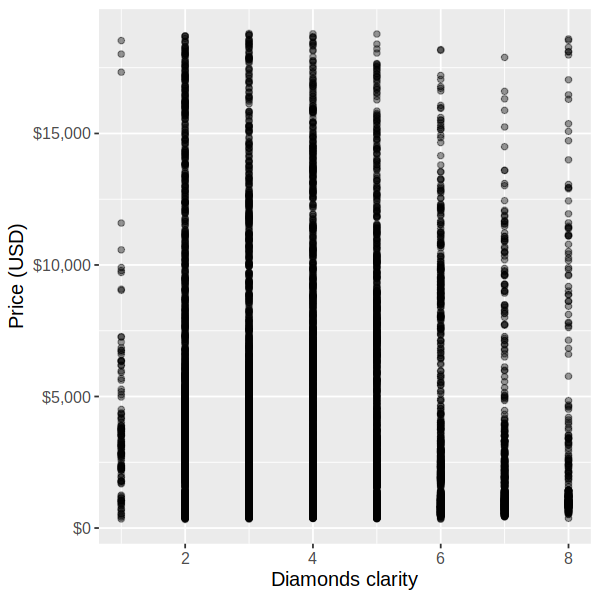

In [19]:
options(repr.plot.width = 5, repr.plot.height = 5)
clarity_plot <- ggplot(diamonds, aes(x = clarity, y = price)) +
                geom_point(alpha = 0.4) +
                xlab("Diamonds clarity") +
                ylab("Price (USD)") +
                scale_y_continuous(labels = dollar_format()) + 
                theme(text = element_text(size = 12))
clarity_plot

From these graphs, we see that as carat increases, the price also increases. However, it does not appear as though there is a clear relationship between the clarity of a diamonds and its price from the given graph and means above. We believe that this data may be a misrepresentation of the true nature of how clarity affects the price since the weight of the diamond also plays a large role in the value of the diamond. Thus, our next step is to clean this data up. From here, we want to find the ratio between the clarity to carat values to find on average, how the clarity of a diamond affects its price. 

### Methods & Results

Since we are trying to estimate a numerical value (the price of diamond), our is aim to perform knn regression on our data set. From here, our first step is to split the data into training and testing sets. 

In [21]:
diamonds_split <- initial_split(diamonds, prop = 0.75, strata = price)
diamonds_train <- training(diamonds_split)
diamonds_test <- testing(diamonds_split)

Next, we want to make our data useable. Our initial assumption is that the price of a diamond is a function of the clarity multiplied by its carat (P = Cl x Ca, where P is price, Cl is a ratio known as the "Clarity multiplier", and Ca is carat). Assuming this, we can try to wrangle our data in a way such that it fits this formula. First, we want to isolate for the clarity multiplier. This is the amount of value that the clarity value adds to the diamond, and is a ratio of clarity and carat. Next, we want to find the price of a diamond in relation to only its carat. In order to do this, we need to divide the price 

carat,cut,color,clarity,depth,table,price,x,y,z,clarity.scaled,carat.scaled
<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.23,Ideal,E,2,61.5,55,326,3.95,3.98,2.43,8.695652,37.49000
0.24,Very Good,J,6,62.8,57,336,3.94,3.96,2.48,25.000000,13.44000
0.30,Good,J,3,64.0,55,339,4.25,4.28,2.73,10.000000,33.90000
0.23,Very Good,G,6,60.4,58,354,3.97,4.01,2.41,26.086957,13.57000
0.23,Very Good,F,5,60.0,57,402,4.00,4.03,2.41,21.739130,18.49200
0.24,Very Good,F,3,60.9,61,404,4.02,4.03,2.45,12.500000,32.32000
0.35,Ideal,I,5,60.9,57,552,4.54,4.59,2.78,14.285714,38.64000
0.24,Very Good,D,7,61.5,60,553,3.97,4.00,2.45,29.166667,18.96000
0.26,Very Good,F,6,59.2,60,554,4.19,4.22,2.49,23.076923,24.00667


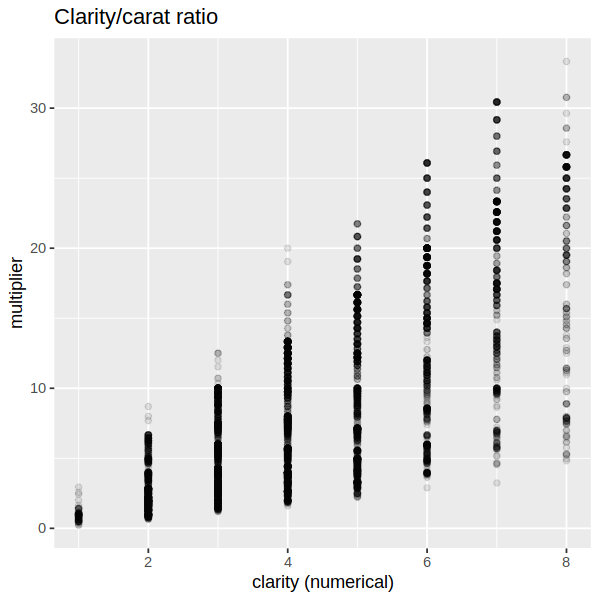

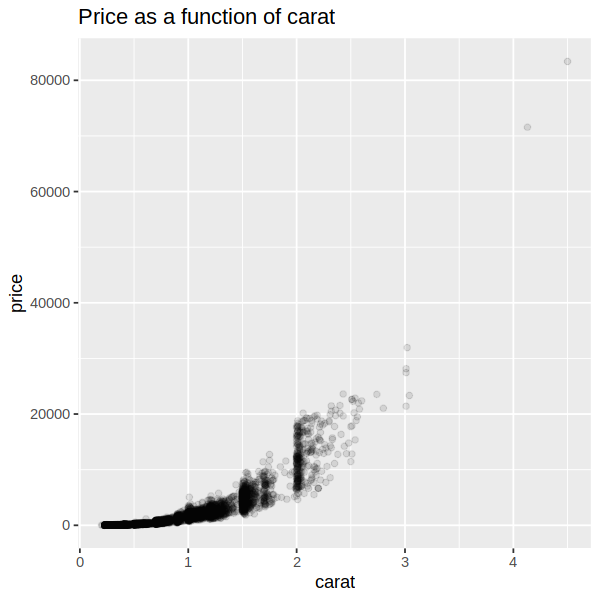

In [29]:
scaled_train <- diamonds_train |>
    mutate(clarity.scaled = clarity/carat) |>
    mutate(carat.scaled = price/clarity.scaled)
head(scaled_train)
scaled_test <- diamonds_test |>
    mutate(clarity.scaled = clarity/carat, carat.scaled = price/clarity)
clarity_plot <- ggplot(scaled_train, aes(clarity, clarity.scaled)) + geom_point(alpha = 0.1) +
labs(x = "clarity (numerical)", y = "multiplier") +
ggtitle("Clarity/carat ratio")
carat_plot <- ggplot(scaled_train, aes(carat, carat.scaled)) + geom_point(alpha = 0.1) +
labs(x = "carat", y = "price (USD)") +
ggtitle("Price as a function of carat") 
clarity_plot
carat_plot

From these graphs, we can see that there are more distinct positive relationships between the carat, clarity and the price of the diamonds. Now, we just need to perform knn regression. 

In [30]:
diamonds_spec <- nearest_neighbor(weight_func = "rectangular", 
                                  neighbors = tune()) |>
                 set_engine("kknn") |>
                 set_mode("regression")

carat_recipe <- recipe(carat.scaled ~ carat, data = scaled_train) |>
                   step_scale(all_predictors()) |>
                   step_center(all_predictors())
carat_recipe


clarity_recipe <- recipe(clarity.scaled ~ clarity, data = scaled_train) |>
                   step_scale(all_predictors()) |>
                   step_center(all_predictors())
clarity_recipe 

Recipe

Inputs:

      role #variables
   outcome          1
 predictor          1

Operations:

Scaling for all_predictors()
Centering for all_predictors()

Recipe

Inputs:

      role #variables
   outcome          1
 predictor          1

Operations:

Scaling for all_predictors()
Centering for all_predictors()

In [31]:
diamonds_vfold <- vfold_cv(scaled_train, v = 5, strata = price)
clarity_vfold <- vfold_cv(scaled_train, v = 5, strata = price)
carat_workflow <- workflow() |>
                  add_recipe(carat_recipe) |>
                  add_model(diamonds_spec)
carat_workflow
clarity_workflow <- workflow() |>
                  add_recipe(clarity_recipe) |>
                  add_model(diamonds_spec)
clarity_workflow

══ Workflow ════════════════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────
K-Nearest Neighbor Model Specification (regression)

Main Arguments:
  neighbors = tune()
  weight_func = rectangular

Computational engine: kknn 


══ Workflow ════════════════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────
K-Nearest Neighbor Model Specification (regression)

Main Arguments:
  neighbors = tune()
  weight_func = rectangular

Computational engine: kknn 


In [39]:
gridvals <- tibble(neighbors = seq(from = 1, to = 100, by = 5))
carvals <- tibble(neighbors = seq(from = 1, to = 10, by = 1))
carat_results <- carat_workflow |>
                  tune_grid(resamples = diamonds_vfold, grid = carvals) |>
                  collect_metrics()




In [33]:
clarity_results <- clarity_workflow |>
                  tune_grid(resamples = clarity_vfold, grid = gridvals) |>
                  collect_metrics()

In [40]:
carat_min <- carat_results |>
                filter(.metric == "rmse") |>
                filter(mean == min(mean))
carat_min
clarity_min <- clarity_results |>
                filter(.metric == "rmse") |>
                filter(mean == min(mean))
clarity_min

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
4,rmse,standard,1167.878,5,86.32429,Preprocessor1_Model04


neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
96,rmse,standard,6.784831,5,0.02438835,Preprocessor1_Model20


In [ ]:
We want to choose the number of neighbors with the lowest RMSE so that we can produce the best knn model possible. 

In [41]:
carat_k <- carat_min |>
              pull(neighbors)

carat_spec <- nearest_neighbor(weight_func = "rectangular", 
                              neighbors = carat_k) |>
                 set_engine("kknn") |>
                 set_mode("regression")

carat_best_fit <- workflow() |>
                     add_recipe(carat_recipe) |>
                     add_model(carat_spec) |>
                     fit(data = scaled_train)

carat_summary <- carat_best_fit |>
                  predict(scaled_test) |>
                  bind_cols(scaled_test) |>
                  metrics(truth = price, estimate = .pred)
carat_summary

clarity_k <- clarity_min |>
              pull(neighbors)

clarity_spec <- nearest_neighbor(weight_func = "rectangular", 
                              neighbors = clarity_k) |>
                 set_engine("kknn") |>
                 set_mode("regression")

clarity_best_fit <- workflow() |>
                     add_recipe(clarity_recipe) |>
                     add_model(clarity_spec) |>
                     fit(data = scaled_train)

clarity_summary <- clarity_best_fit|>
                  predict(scaled_test) |>
                  bind_cols(scaled_test) |>
                  metrics(truth = clarity.scaled, estimate = .pred)
clarity_summary

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,3226.4366274
rsq,standard,0.6601887
mae,standard,2357.6605149


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,6.8639449
rsq,standard,0.5584968
mae,standard,5.5362911


.pred,carat,cut,color,clarity,depth,table,price,x,y,z,clarity.scaled,carat.scaled
<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
22.64514,0.23,Ideal,E,2,61.5,55,326,3.95,3.98,2.43,8.695652,37.490
20.92857,0.24,Very Good,J,6,62.8,57,336,3.94,3.96,2.48,25.000000,13.440
40.92500,0.30,Good,J,3,64.0,55,339,4.25,4.28,2.73,10.000000,33.900
22.64514,0.23,Very Good,G,6,60.4,58,354,3.97,4.01,2.41,26.086957,13.570
22.64514,0.23,Very Good,F,5,60.0,57,402,4.00,4.03,2.41,21.739130,18.492
20.92857,0.24,Very Good,F,3,60.9,61,404,4.02,4.03,2.45,12.500000,32.320


.pred,carat,cut,color,clarity,depth,table,price,x,y,z,clarity.scaled,carat.scaled
<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
5.594071,0.23,Ideal,E,2,61.5,55,326,3.95,3.98,2.43,8.695652,37.490
20.609432,0.24,Very Good,J,6,62.8,57,336,3.94,3.96,2.48,25.000000,13.440
9.166996,0.30,Good,J,3,64.0,55,339,4.25,4.28,2.73,10.000000,33.900
20.609432,0.23,Very Good,G,6,60.4,58,354,3.97,4.01,2.41,26.086957,13.570
16.547442,0.23,Very Good,F,5,60.0,57,402,4.00,4.03,2.41,21.739130,18.492
9.166996,0.24,Very Good,F,3,60.9,61,404,4.02,4.03,2.45,12.500000,32.320


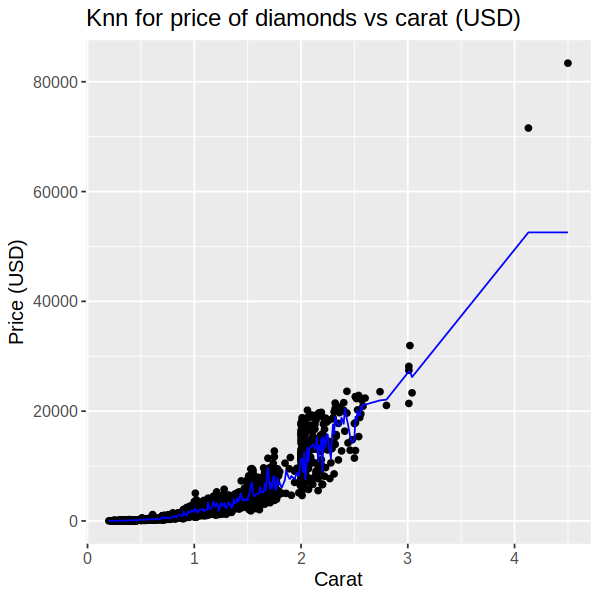

In [ ]:
options(repr.plot.width = 5, repr.plot.height = 5)
carat_preds <- carat_best_fit |>
                  predict(scaled_train) |>
                  bind_cols(scaled_train)
head(carat_preds)
carat_plot <- ggplot(carat_preds, aes(x = carat, y = carat.scaled)) +
                 geom_point() +
                 geom_line (data = carat_preds, 
                            mapping = aes(x = carat, y = .pred), 
                            color = "blue") +
                 xlab("Carat") +
                 ylab("Price (USD)") +
                 ggtitle("Knn for price of diamonds vs carat (USD)") +
                 theme(text = element_text(size = 12))

carat_plot
clarity_preds <- clarity_best_fit |>
                  predict(scaled_train) |>
                  bind_cols(scaled_train)
head(clarity_preds)
clarity_plot <- ggplot(clarity_preds, aes(x = clarity, y = clarity.scaled)) +
                 geom_point() +
                 geom_line (data = clarity_preds, 
                            mapping = aes(x = clarity, y = .pred), 
                            color = "blue") +
                 xlab("Clarity") +
                 ylab("Clarity multiplier") +
                 ggtitle("Knn for clarity to carat ratio") +
                 theme(text = element_text(size = 12))


clarity_plot

From these two graphs, we can estimate the price of any diamond, by first looking at its carat and estimating
its price, then multiplying by its clarity multiplier value. 
Note that although ideally we would want a 3d graph, we were unable to create one. Rather, these graphs may be looked at the x and y planes of the graph while the price is the z plane. 

### Discussion



Graph 1: Diamonds carat vs Price (USD)
As the weight of the diamond increases, so does the price. This is expected because the higher carat value a diamond has, the more weight it has and therefore, it will cost more compared to a diamond with a smaller weight. There appears to be a positive exponential increase in the price of a diamond as its carat increases. 
One thing of note is that since we have few data points for the higher carat diamonds, the data could be skewed. 
Our RMSE for this knn model is 3226.45, which means that on average, there is a \\$3226.45 range of uncertainty between our predicted value and the diamond's true value. However, according to our graph, it appears as though the points seem to converge at low carat, and diverge at higher carats, thus we could say that at low carat values, the uncertainty would be less than $3226 dollars whereas it could be more at high carat values. While this RMSE may seem high, it also seems to affect the higher carat diamonds disproportionately. Whether this value seems acceptable or not may vary depending on the specific situations, however, it is generally more sensible that the higher carat diamonds have a greater uncertainty, as people are more likely to pay more, as well as negotiate and bargain for prices. 

Graph 2: Diamonds clarity to carat ratio
Clarity is the measure of how many imperfections a diamond has. The graph shows that the price increases when the diamonds have fewer imperfections (a higher clarity). This is expected because fewer imperfections speak to the quality of the diamond itself, as diamonds with higher quality are harder to damage.
The multiplier value of clarity seems to be linear. 

The RMSE of this model is 6.86. While this may seem like a high number, it is also important to note that, much like the previous graph, the points at low clarity values seem to converge while high clarity values seem to diverge. This means that the RMSE should be much lower than 6.86 for low clarity diamonds but perhaps higher at high clarity diamonds. Again, in order to determine whether or not this value seems acceptable depends greatly on the specific situations. With higher purity diamonds, they may be seen as luxury goods and incredibily rare, thus people may be more willing to pay or more likely to bargain for lower prices. 


Overall, when it comes to higher carat and clarity diamonds, we can expect to see diverging prices. As previously mentioned, people may be more willing to pay or bargain, however, there are other external factors that may have large effects on the diamond's value. We can infer that while people look for the perfect diamond, they may want a specific color or cut, which may explain why these "higher tier" diamonds see such a wide range of prices, while "low tier" diamonds may be purchased just for the sake of owning a diamond. 




We originally hypothesized that diamonds with a higher carat/clarity value would increase the price of diamonds. Based on the graphs and the data collected, as the clarity and carat increases, the price of the diamond also increases, therefore supporting our hypothesis. This could impact the choice of certain buyers as each buyer has a specific price range and/or specific carat/clarity range in mind when choosing their perfect diamond. The effect that the carat and clarity have on the pricing of diamonds could then therefore sway their final decisions.
However, even though our results support our original hypothesis, it is still difficult to reach a concrete and firm answer as to how these factors affect pricing as there are outliers in the relationship between pricing and diamond carats. Since there are outliers in the relationship between these 2 variables, there are also outliers between pricing and the clarity of diamonds. 
This could lead us to future questions such as wondering if any other factors could contribute to the price of diamonds and if their presence will have either a more or less significant effect on the pricing of diamonds. Do these external factors have a greater impact at higher carat/clarity values or lower carat/clarity values? 


### References


Lang, A.R. "Glimpses into the Growth History of Natural Diamonds." Journal of Crystal Growth, vol. 24-25, 1974, pp. 108-115, https://doi.org/10.1016/0022-0248(74)90287-5. Accessed 4 Dec. 2023.

Arvidsson, Joakim. "Diamonds." GitHub, October 2023. github.com/tidyverse/ggplot2/blob/main/data-raw/diamonds.csv.

Smith, G. "The allure, magic and mystery - A brief history of diamonds." Journal of the Southern African Institute of Mining and Metallurgy, vol. 103, no. 9, November 2003, pp. 529-534.
